# Install libraries 

In [ ]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126

In [ ]:
!pip install matplotlib numpy mesh-to-sdf trimesh plyfile open3d

# Clone the repository to get the data

 To train a DeepSDF model, it is necessary to have a dataset consisting of a collection of 3D shapes. In this notebook, we will use any objects from internet. 

 When we clone the repository, we can find a folder called `dataset`. This folder contains a collection of objects that we will use to train our model.


In [ ]:
#!git clone https://github.com/arielz001/Hands-On-DeepSDF.git

# Understanding SDF values

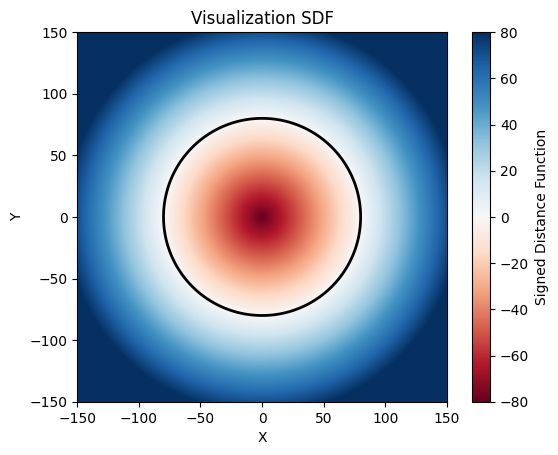

In [6]:
import numpy as np
import matplotlib.pyplot as plt
def example_sdf():
    def circle_sdf(x, y, center, radius):
        return np.sqrt((x - center[0])**2 + (y - center[1])**2) - radius

    x = np.linspace(-150, 150, 400)
    y = np.linspace(-150, 150, 400)
    X, Y = np.meshgrid(x, y)

    fig, ax = plt.subplots()
    ax.set_title("Visualization SDF")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_aspect('equal')

    center = [0, 0]
    radius = 80
    Z = circle_sdf(X, Y, center, radius)
    im = ax.imshow(Z, extent=[x.min(), x.max(), y.min(), y.max()],
                cmap='RdBu', origin='lower', vmin=-radius, vmax=radius)

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Signed Distance Function')

    contour = ax.contour(X, Y, Z, levels=[0], colors='black', linewidths=2)

    plt.show()
example_sdf()

# Dataset

## Preprocessing data

##### Now we must create the sdf values for each obj in the dataset

In [8]:
from mesh_to_sdf import sample_sdf_near_surface

import os
import glob
import trimesh
import numpy as np


def generate_xyz_sdf(filename):
    mesh = trimesh.load(os.path.abspath(filename),force='mesh')
    xyz, sdf = sample_sdf_near_surface(mesh, number_of_points=15000)
    return xyz, sdf

def writeSDFToNPZ(xyz, sdfs, filename):
    num_vert = len(xyz)
    pos = []
    neg = []

    for i in range(num_vert):
        v = xyz[i]
        s = sdfs[i]

        if s > 0:
            for j in range(3):
                pos.append(v[j])
            pos.append(s)
        else:
            for j in range(3):
                neg.append(v[j])
            neg.append(s)
    
    np.savez(filename, pos=np.array(pos).reshape(-1, 4), neg=np.array(neg).reshape(-1, 4))
    
def process(mesh_filepath, target_filepath):
    xyz, sdfs = generate_xyz_sdf(mesh_filepath)
    writeSDFToNPZ(xyz, sdfs, target_filepath)
    
target_path = f"./processed_data"

os.makedirs(target_path, exist_ok=True)

mesh_filenames = list(glob.iglob("dataset/"  + "*.obj"))

N = len(mesh_filenames)
it = 0

for mesh_filepath in mesh_filenames:
    base_name = os.path.splitext(os.path.basename(mesh_filepath))[0]
    target_filepath = os.path.join(target_path, base_name)
    print(f"base_name: {base_name}")
    process(mesh_filepath, target_filepath)

    it += 1
    print(f"Process finished directory: {it}/{N}")

base_name: 5
Process finished directory: 1/6
base_name: 1
Process finished directory: 2/6
base_name: 3
Process finished directory: 3/6
base_name: 6
Process finished directory: 4/6
base_name: 2
Process finished directory: 5/6
base_name: 4
Process finished directory: 6/6


#### Shapenet type of dataset

This class implements a custom PyTorch dataset that loads data from `.npz` files and generates balanced samples of positive and negative points.

## How it works

- Reads all `.npz` files from a given folder.
- Each file contains two arrays: positive points (`pos`) and negative points (`neg`).
- For each file, it takes a total of 15,000 points per sample, split evenly as 7,500 positive and 7,500 negative points.
- If there are fewer than 7,500 points of a type, it performs random sampling with replacement to complete the quota.
- If there are more than 7,500 points, it takes a random continuous block of that size.
- Concatenates both subsets to form the final sample.
- Stores all loaded samples in an internal list.

## Methods

- `__getitem__(index)`: returns a tuple `(index, sample)` for the sample at the given index.
- `__len__()`: returns the total number of samples (loaded `.npz` files).

---

This dataset is designed to facilitate training models that require balanced samples of positive and negative points from data stored in `.npz` files.


In [ ]:
import torch
from torch.utils.data import Dataset

import numpy as np
import random
from pathlib import Path

class ShapeNet_Dataset(Dataset):
    
    def __init__(self, dataset_path):
        global num_samples
        self.dataset = []
        for file_name in sorted(Path(dataset_path).glob("*.npz")):
            npz = np.load(file_name)
            pos_tensor = torch.from_numpy(npz["pos"])
            neg_tensor = torch.from_numpy(npz["neg"])
          
            # split the sample into half
            half = int(15000 / 2)

            pos_size = pos_tensor.shape[0]
            neg_size = neg_tensor.shape[0]
            
            if pos_size <= half:
                random_pos = (torch.rand(half) * pos_tensor.shape[0]).long()
                sample_pos = torch.index_select(pos_tensor, 0, random_pos)
            else:
                pos_start_ind = random.randint(0, pos_size - half)
                sample_pos = pos_tensor[pos_start_ind : (pos_start_ind + half)]

            if neg_size <= half:
                random_neg = (torch.rand(half) * neg_tensor.shape[0]).long()
                sample_neg = torch.index_select(neg_tensor, 0, random_neg)
            else:
                neg_start_ind = random.randint(0, neg_size - half)
                sample_neg = neg_tensor[neg_start_ind : (neg_start_ind + half)]

            samples = torch.cat([sample_pos, sample_neg], 0)
            
            self.dataset.append(samples)
            
    def __getitem__(self, index):
        return index, self.dataset[index]
    
    def __len__(self):
        return len(self.dataset)

# Define the model

The following image shows the architecture of the DeepSDF model.

![Architecture](./assets/network-architecture.png)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Decoder(nn.Module):
    def __init__(
        self,
        latent_size = 256,
        dims=[512, 512, 512, 512, 512, 512, 512, 512, 1], 
        dropout=[0, 1, 2, 3, 4, 5, 6, 7],
        dropout_prob=0.2,
        norm_layers=[0, 1, 2, 3, 4, 5, 6, 7],
        latent_in=[4],
        weight_norm=True):

        super(Decoder, self).__init__()
        
        dims = [latent_size + 3] + dims 

        self.num_layers = len(dims)
        self.norm_layers = norm_layers
        self.latent_in = latent_in
        self.weight_norm = weight_norm

        for layer in range(0, self.num_layers - 1):
            if layer + 1 in latent_in:
                out_dim = dims[layer + 1] - dims[0]
            else:
                out_dim = dims[layer + 1]

            if weight_norm and layer in self.norm_layers:
                setattr(
                    self,
                    "lin" + str(layer),
                    nn.utils.weight_norm(nn.Linear(dims[layer], out_dim)),
                )
            else:
                setattr(self, "lin" + str(layer), nn.Linear(dims[layer], out_dim))

        self.relu = nn.ReLU()
        self.dropout_prob = dropout_prob
        self.dropout = dropout
        self.th = nn.Tanh()

    def forward(self, input):
        x = input

        for layer in range(0, self.num_layers - 1):
            lin = getattr(self, "lin" + str(layer))
            if layer in self.latent_in:
                x = torch.cat([x, input], 1)
           
            x = lin(x)
            
            if layer < self.num_layers - 2:
                x = self.relu(x)
                if self.dropout is not None and layer in self.dropout:
                    x = F.dropout(x, p=self.dropout_prob, training=self.training)

        if hasattr(self, "th"):
            x = self.th(x)

        return x

# Train the model

In [4]:
import torch
from torch.utils.data import DataLoader

import numpy as np
import random
import os

def train_decoder(epochs = 1000,
                batch_size=15,
                lat_vecs_std = 0.01,
                decoder_lr = 0.0005,
                lat_vecs_lr = 0.001,
                train_data_path = "./processed_data",
                checkpoint_save_path = "./checkpoints/"):
    
    os.makedirs(checkpoint_save_path, exist_ok=True)
    # ------------ set random seed ------------

    np.random.seed(42)
    torch.manual_seed(42)
    random.seed(42)

    # ------------ setting device on GPU if available, else CPU ------------

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print('Using device:', device)

    # ------------ load dataset ------------

    train_dataset = ShapeNet_Dataset(train_data_path)
    torch_train = DataLoader(train_dataset,shuffle=True, batch_size=batch_size, num_workers=1)

    # ------------ load auto decoder model ------------
    
    SDF_autodecoder = Decoder().to(device)

    # ------------ set training parameters ------------

    # initializa latent vectors
    lat_vecs = torch.nn.Embedding(len(train_dataset), 256, max_norm=1.0).cuda()
    torch.nn.init.normal_(lat_vecs.weight.data, 0.0, lat_vecs_std)

    # set optimizer
    optimizer_all = torch.optim.Adam(
                    [{"params": SDF_autodecoder.parameters(),
                    "lr": decoder_lr},
                    {"params": lat_vecs.parameters(),
                    "lr": lat_vecs_lr}])
    # loss function
    loss_l1 = torch.nn.L1Loss(reduction="sum")

    # other parameters
    minT, maxT = -0.1, 0.1 # clamp

    # scheduler
    # scheduler = StepLR(optimizer_all, step_size=100, gamma=0.5)  

    # ------------ training process ------------ 

    print("---- start training ----")
    loss_log = []

    for epoch in range(epochs):
        
        SDF_autodecoder.train()

        losses = []
        
        for index, train_data in torch_train:
            
            train_data = train_data.reshape(-1,4).cuda()
            num_sdf_samples = train_data.shape[0]
            train_data.requires_grad = False

            xyz = train_data[:, 0:3]
            sdf_gt = train_data[:, 3].unsqueeze(1)
            sdf_gt = torch.clamp(sdf_gt, minT, maxT)

            optimizer_all.zero_grad()

            # concatenate latent vector and xyz query
            indices = index.cuda().unsqueeze(-1).repeat(1, 15000).view(-1)
            batch_vecs = lat_vecs(indices)
            input = torch.cat([batch_vecs, xyz], dim=1)

            # NN optimization
            pred_sdf = SDF_autodecoder(input)
            pred_sdf = torch.clamp(pred_sdf, minT, maxT)

            loss = loss_l1(pred_sdf, sdf_gt.cuda()) / num_sdf_samples
            # loss += 1e-4 * torch.mean(batch_vecs.pow(2)) # L2 regularization
            loss.backward()
            losses.append(loss.data.mean().cpu())

            optimizer_all.step()
            # scheduler.step()
        # Print batch loss
        epoch_loss = np.mean(losses)
        loss_log.append(epoch_loss)
        print('[%d/%d] Loss: %.5f' % (epoch+1, epochs, epoch_loss))
        
        torch.save({
                'epoch': epoch,
                'model': SDF_autodecoder.state_dict(),
                'latent_vectors': lat_vecs.state_dict(),
                'optimizer': optimizer_all.state_dict(),
                'loss_log': loss_log,
                # }, checkpoint_save_path + str(epoch+1) + ".pt")
                }, checkpoint_save_path  + "trained_model_1.pt")

#### Training the model

In [5]:
train_decoder(epochs = 1500,
                    batch_size=10,
                    lat_vecs_std = 0.01,
                    decoder_lr = 0.0005,
                    lat_vecs_lr = 0.001)

Using device: cuda


/home/ariel/miniconda3/envs/handson/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


---- start training ----
[1/1500] Loss: 0.01658
[2/1500] Loss: 0.02610
[3/1500] Loss: 0.02088
[4/1500] Loss: 0.00932
[5/1500] Loss: 0.01240
[6/1500] Loss: 0.01586
[7/1500] Loss: 0.01370
[8/1500] Loss: 0.00919
[9/1500] Loss: 0.00815
[10/1500] Loss: 0.01077
[11/1500] Loss: 0.01169
[12/1500] Loss: 0.01038
[13/1500] Loss: 0.00827
[14/1500] Loss: 0.00769
[15/1500] Loss: 0.00886
[16/1500] Loss: 0.00968
[17/1500] Loss: 0.00928
[18/1500] Loss: 0.00817
[19/1500] Loss: 0.00745
[20/1500] Loss: 0.00777
[21/1500] Loss: 0.00844
[22/1500] Loss: 0.00852
[23/1500] Loss: 0.00802
[24/1500] Loss: 0.00744
[25/1500] Loss: 0.00734
[26/1500] Loss: 0.00767
[27/1500] Loss: 0.00789
[28/1500] Loss: 0.00774
[29/1500] Loss: 0.00737
[30/1500] Loss: 0.00713
[31/1500] Loss: 0.00723
[32/1500] Loss: 0.00746
[33/1500] Loss: 0.00744
[34/1500] Loss: 0.00720
[35/1500] Loss: 0.00700
[36/1500] Loss: 0.00701
[37/1500] Loss: 0.00713
[38/1500] Loss: 0.00712
[39/1500] Loss: 0.00697
[40/1500] Loss: 0.00684
[41/1500] Loss: 0.00686


# Reconstruct mesh from a latent code

In [ ]:
import torch

import numpy as np
import plyfile
import skimage.measure

# Learn the latent code for the test model
def reconstruct_latent(decoder, 
                       sdf_data, 
                       iterations = 800,
                       init_std = 0.01, 
                       lr = 5e-4):

    # parameters
    latent_size = 256
    num_samples = num_samples

    # initilise latent
    # latent = torch.ones(1, latent_size).normal_(mean=0, std=init_std).cuda()
    latent = torch.rand(1, latent_size).normal_(mean=0, std=init_std).cuda()

    latent.requires_grad = True

    # set optimizer and loss
    optimizer = torch.optim.Adam([latent], lr=lr)
    loss_l1 = torch.nn.L1Loss()
    minT, maxT = -0.1, 0.1 # clamp

    for it in range(iterations):
        
        decoder.eval()

        xyz = sdf_data.cuda()[:, 0:3]
        sdf_gt = sdf_data.cuda()[:, 3].unsqueeze(1)
        sdf_gt = torch.clamp(sdf_gt, minT, maxT)

        optimizer.zero_grad()

        latent_inputs = latent.expand(num_samples, -1)
        inputs = torch.cat([latent_inputs, xyz], 1)
        pred_sdf = decoder(inputs)
        pred_sdf = torch.clamp(pred_sdf, minT, maxT)

        loss = loss_l1(pred_sdf, sdf_gt)
        loss += 1e-4 * torch.mean(latent.pow(2)) # L2 regularization

        loss.backward()
        optimizer.step()
        
        loss_num = loss.cpu().data.numpy()
        print('[%d/%d] Loss: %.5f' % (it+1, iterations, loss_num))

    return latent

# Predict SDF with the latent code and trained decoder
def decode_sdf(decoder, latent_vector, queries):
    num_samples = queries.shape[0]
    latent_repeat = latent_vector.expand(num_samples, -1)
    inputs = torch.cat([latent_repeat, queries.cuda()], 1)
    sdf = decoder(inputs)
    return sdf


def convert_sdf_samples_to_obj(
    pytorch_3d_sdf_tensor,# }, checkpoint_save_path + str(epoch+1) + ".pt")
    voxel_grid_origin,
    voxel_size,
    obj_filename_out):
    """
    Convert sdf samples to .obj

    :param pytorch_3d_sdf_tensor: a torch.FloatTensor of shape (n,n,n)
    :param voxel_grid_origin: list of three floats: the origin of the voxel grid (x, y, z)
    :param voxel_size: float, size of each voxel
    :param obj_filename_out: string, path to save the .obj file
    """

    numpy_3d_sdf_tensor = pytorch_3d_sdf_tensor.numpy()

    verts, faces, normals, values = skimage.measure.marching_cubes(
        numpy_3d_sdf_tensor, level=0.0, spacing=[voxel_size] * 3
    )

    mesh_points = np.zeros_like(verts)
    mesh_points[:, 0] = voxel_grid_origin[0] + verts[:, 0]
    mesh_points[:, 1] = voxel_grid_origin[1] + verts[:, 1]
    mesh_points[:, 2] = voxel_grid_origin[2] + verts[:, 2]

    with open(obj_filename_out, 'w') as f:
        for v in mesh_points:
            f.write(f'v {v[0]} {v[1]} {v[2]}\n')
        for face in faces:
            # OBJ uses 1-based indexing
            f.write(f'f {face[0]+1} {face[1]+1} {face[2]+1}\n')



def create_mesh(filename, 
                decoder, 
                latent_vec,
                N=128, 
                max_batch=16 ** 3):
 
    decoder.eval()

    # NOTE: the voxel_origin is actually the (bottom, left, down) corner, not the middle
    voxel_origin = [-1, -1, -1]
    voxel_size = 2.0 / (N - 1)

    overall_index = torch.arange(0, N ** 3, 1, out=torch.LongTensor())
    samples = torch.zeros(N ** 3, 4)

    # transform first 3 columns
    # to be the x, y, z index
    samples[:, 2] = overall_index % N
    samples[:, 1] = (overall_index.long() / N) % N
    samples[:, 0] = ((overall_index.long() / N) / N) % N

    # transform first 3 columns
    # to be the x, y, z coordinate
    samples[:, 0] = (samples[:, 0] * voxel_size) + voxel_origin[2]
    samples[:, 1] = (samples[:, 1] * voxel_size) + voxel_origin[1]
    samples[:, 2] = (samples[:, 2] * voxel_size) + voxel_origin[0]

    num_samples = N ** 3

    samples.requires_grad = False

    head = 0

    while head < num_samples:
        sample_subset = samples[head : min(head + max_batch, num_samples), 0:3]#.cuda()
        samples[head : min(head + max_batch, num_samples), 3] = (
            decode_sdf(decoder, latent_vec, sample_subset)
            .squeeze(1)
            .detach()
            .cpu()
        )
        head += max_batch

    sdf_values = samples[:, 3]
    sdf_values = sdf_values.reshape(N, N, N)

    convert_sdf_samples_to_obj(sdf_values, 
                               voxel_grid_origin=[0.0, 0.0, 0.0], 
                               voxel_size=0.01, 
                               obj_filename_out=filename+'.obj')


def reconstruct(test_sample,
                decoder,
                filename,
                lat_iteration,
                lat_init_std = 0.01, 
                lat_lr = 5e-4,
                N=128, 
                max_batch=16 ** 3):

    # pass the test model to decoder
    _, test_sdf_data = test_sample

    print("---- Fitting latent vector ----")
    latent_vector = reconstruct_latent(decoder, 
                                       test_sdf_data, 
                                       iterations = lat_iteration,
                                       init_std = lat_init_std, 
                                       lr = lat_lr)

    print("---- Reconstructing mesh ----")
    print(" This could take a while ")
    
    create_mesh(filename, 
                decoder,
                latent_vector,
                N=N, 
                max_batch=max_batch)
    
    print("Mesh saved to " + filename + ".obj")

In [ ]:
import torch


# ------------ setting device on GPU if available, else CPU ------------
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

# ------------ load some samples ------------
train_data_path = "./processed_data"
train_dataset = ShapeNet_Dataset(train_data_path)

# ------------ load decoder ------------
decoder = Decoder().to(device)
checkpoint = torch.load("./checkpoints/trained_model_1.pt", weights_only=False)
decoder.load_state_dict(checkpoint["model"])

# ------------ reconstruction ------------
reconstruction_path = "./reconstruction"
os.makedirs(reconstruction_path, exist_ok=True)


obj_to_reconstruct_idx = 0
train_sample = train_dataset[obj_to_reconstruct_idx]

filename = f"{reconstruction_path}/example_" + str(obj_to_reconstruct_idx)
reconstruct(train_sample,
            decoder,
            filename,
            lat_iteration=1000,
            lat_init_std = 0.01, 
            lat_lr = 5e-4,
            N=256, 
            max_batch=32 ** 3)

Using device: cuda
---- Fitting latent vector ----
[1/1000] Loss: 0.07320
[2/1000] Loss: 0.07198
[3/1000] Loss: 0.07069
[4/1000] Loss: 0.06944
[5/1000] Loss: 0.06822
[6/1000] Loss: 0.06698
[7/1000] Loss: 0.06568
[8/1000] Loss: 0.06429
[9/1000] Loss: 0.06271
[10/1000] Loss: 0.06095
[11/1000] Loss: 0.05888
[12/1000] Loss: 0.05666
[13/1000] Loss: 0.05452
[14/1000] Loss: 0.05232
[15/1000] Loss: 0.05023
[16/1000] Loss: 0.04825
[17/1000] Loss: 0.04645
[18/1000] Loss: 0.04475
[19/1000] Loss: 0.04319
[20/1000] Loss: 0.04173
[21/1000] Loss: 0.04036
[22/1000] Loss: 0.03903
[23/1000] Loss: 0.03763
[24/1000] Loss: 0.03627
[25/1000] Loss: 0.03488
[26/1000] Loss: 0.03372
[27/1000] Loss: 0.03255
[28/1000] Loss: 0.03121
[29/1000] Loss: 0.02953
[30/1000] Loss: 0.02801
[31/1000] Loss: 0.02665
[32/1000] Loss: 0.02543
[33/1000] Loss: 0.02410
[34/1000] Loss: 0.02310
[35/1000] Loss: 0.02213
[36/1000] Loss: 0.02118
[37/1000] Loss: 0.02031
[38/1000] Loss: 0.01913
[39/1000] Loss: 0.01790
[40/1000] Loss: 0.0166

#### Visualize the decoded shape

In [16]:
import trimesh 

meshes_reconstructed = os.listdir('./reconstruction')
mesh = os.path.join('./reconstruction', meshes_reconstructed[5])
mesh = trimesh.load(mesh)
mesh.show()

# shape completion

In [17]:
def generate_partial_pointcloud(mesh):

    samples = np.array(trimesh.sample.sample_surface(mesh, 10000)[0])

    t = [0.5, 1.0 , 1.0]
    v_min, v_max = mesh.bounds

    for i in range(3):
        t_max = v_min[i] + t[i] * (v_max[i] - v_min[i])
        samples = samples[samples[:, i] < t_max]
    
    return samples

In [18]:
data = os.listdir('./dataset')
meshes_to_completion = [f for f in data if f.endswith('.obj')]
object_path = os.path.join('./dataset', meshes_to_completion[2])
mesh = trimesh.load(object_path)
partial_pc = generate_partial_pointcloud(mesh=mesh)


In [19]:
import open3d as o3d

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(partial_pc)
o3d.visualization.draw_geometries([pcd])

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


### infer a new latent code from the shape

In [22]:
from mesh_to_sdf import sample_sdf_near_surface

points = torch.tensor(partial_pc, dtype=torch.float32)

xyz, sdf = sample_sdf_near_surface(mesh, number_of_points=15000)
points = torch.tensor(xyz, dtype=torch.float32)
sdf_values = torch.tensor(sdf, dtype=torch.float32).unsqueeze(1)
points_sdf = torch.cat([points, sdf_values], dim=1)

sample = (None, points_sdf)

reconstruction_from_partial_path = "./reconstruction_from_partial"
os.makedirs(reconstruction_from_partial_path, exist_ok=True)

reconstruct(sample,
            decoder,
            f'{reconstruction_from_partial_path}/reconstructed_mesh',
            lat_iteration=1000,
            lat_init_std=0.01,
            lat_lr=5e-4,
            N=256,
            max_batch=32**3)


---- Fitting latent vector ----
[1/1000] Loss: 0.08582
[2/1000] Loss: 0.08471
[3/1000] Loss: 0.08349
[4/1000] Loss: 0.08227
[5/1000] Loss: 0.08084
[6/1000] Loss: 0.07920
[7/1000] Loss: 0.07763
[8/1000] Loss: 0.07617
[9/1000] Loss: 0.07477
[10/1000] Loss: 0.07348
[11/1000] Loss: 0.07221
[12/1000] Loss: 0.07092
[13/1000] Loss: 0.06949
[14/1000] Loss: 0.06791
[15/1000] Loss: 0.06623
[16/1000] Loss: 0.06470
[17/1000] Loss: 0.06337
[18/1000] Loss: 0.06224
[19/1000] Loss: 0.06126
[20/1000] Loss: 0.06035
[21/1000] Loss: 0.05953
[22/1000] Loss: 0.05881
[23/1000] Loss: 0.05812
[24/1000] Loss: 0.05743
[25/1000] Loss: 0.05675
[26/1000] Loss: 0.05607
[27/1000] Loss: 0.05540
[28/1000] Loss: 0.05474
[29/1000] Loss: 0.05405
[30/1000] Loss: 0.05334
[31/1000] Loss: 0.05258
[32/1000] Loss: 0.05173
[33/1000] Loss: 0.05086
[34/1000] Loss: 0.04998
[35/1000] Loss: 0.04909
[36/1000] Loss: 0.04818
[37/1000] Loss: 0.04728
[38/1000] Loss: 0.04638
[39/1000] Loss: 0.04547
[40/1000] Loss: 0.04457
[41/1000] Loss: 0

In [87]:
mesh = trimesh.load('./output_filename.obj')
mesh.show()